In [2]:
import pandas as pdD
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import entropy, norm, shapiro, kstest
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D  # Import for 3D plotting
import pandas as pd
import numpy as np
import scipy.stats as st
import pandas as pd
from rich.console import Console
from rich.table import Table
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
import os
from utils.helper import *
BEGIN_LABEL = "Benign"
DDOS_LABEL = "DDoS"


In [ ]:
# Directory path
base_path = '/Users/hungwei/Downloads/cicddos2019/versions/3/'

# List of training file paths
file_paths = [
    os.path.join(base_path, 'LDAP-training.parquet'),
    os.path.join(base_path, 'MSSQL-training.parquet'),
    os.path.join(base_path, 'NetBIOS-training.parquet'),
    os.path.join(base_path, 'Portmap-training.parquet'),
    os.path.join(base_path, 'Syn-training.parquet'),
    os.path.join(base_path, 'UDP-training.parquet'),
    os.path.join(base_path, 'UDPLag-training.parquet'),  
    
    os.path.join(base_path, 'DNS-testing.parquet'), #TODO: DNS -> try first ! 
    os.path.join(base_path, 'LDAP-testing.parquet'),
    os.path.join(base_path, 'MSSQL-testing.parquet'),
    os.path.join(base_path, 'NetBIOS-testing.parquet'),
    os.path.join(base_path, 'NTP-testing.parquet'),
    os.path.join(base_path, 'SNMP-testing.parquet'),
    os.path.join(base_path, 'Syn-testing.parquet'),
    os.path.join(base_path, 'TFTP-testing.parquet'),
    os.path.join(base_path, 'UDP-testing.parquet'),
    os.path.join(base_path, 'UDPLag-testing.parquet')
]

# Read and concatenate all Parquet training files into a single DataFrame
dfs = [pd.read_parquet(file_path) for file_path in file_paths]
df_combined = pd.concat(dfs, ignore_index=True)

df_original = df_combined

# Strip column names
df_combined.columns = df_combined.columns.str.strip()

# Replace "Benign" with "DDoS" in the "Label" column (if the column exists)
# Replace all values in the "Label" column with "DDoS", except "Benign"
if 'Label' in df_combined.columns:
    df_combined['Label'] = df_combined['Label'].apply(lambda x: 'DDoS' if x != 'Benign' else x)
# Initialize a console objectㄏ
console = Console()

output_parquet = os.path.join('combined_data.parquet')
df_combined.to_parquet(output_parquet, index=False)
print(f"DataFrame successfully exported as Parquet to {output_parquet}")

# Create a table object with headers for "Index" and "Column Name"
table = Table(show_header=True, header_style="bold magenta")
table.add_column("Index", style="dim", justify="left")
table.add_column("Column Name", style="dim", justify="left")

print(df_combined.head)

# Add each column index and name as a row in the table

FileNotFoundError: [Errno 2] No such file or directory: '/Users/hungwei/Downloads/cicddos2019/versions/3/LDAP-training.parquet'

## 數據處理

- 移除所有 'WebDDoS' 標籤的行。
- 確認標籤分布。
- 抽取 BENIGN 和 UDP-lag 資料的數量。

In [6]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler

def optimize_dtypes(df):
    """
    Optimize DataFrame to reduce memory usage:
    - Downcast numeric types (float64, int64)
    - Convert object columns to category
    - Convert boolean columns to bool
    - Remove redundant rows/columns
    """
    df = df.copy()  # 確保對副本操作，避免影響原始 DataFrame
    
    # Downcast numeric columns
    for col in df.columns:
        col_dtype = df[col].dtype

        if col_dtype == 'float64':
            df[col] = pd.to_numeric(df[col], downcast='float')
        elif col_dtype in ['int64', 'int32']:
            if (df[col] >= 0).all():
                df[col] = pd.to_numeric(df[col], downcast='unsigned')
            else:
                df[col] = pd.to_numeric(df[col], downcast='integer')
    
    # Optimize object columns
    for col in df.select_dtypes(include=['object']).columns:
        num_unique_values = df[col].nunique()
        num_total_values = len(df[col])
        if num_unique_values / num_total_values < 0.5:
            df[col] = df[col].astype('category')
    
    # Optimize boolean columns
    for col in df.select_dtypes(include=['bool']).columns:
        df[col] = df[col].astype('bool')

    # Remove redundant rows and columns
    df.drop_duplicates(inplace=True)
    df = df.loc[:, ~df.columns.duplicated()]

    return df


print(df_combined['Label'].value_counts())

df_cleaned = df_combined.copy()  # 確保操作在副本上，避免警告

# # 填充缺失值
# df_cleaned.loc[:, :] = df_cleaned.fillna(0)

# # 替換無限大值
# df_cleaned.loc[:, :] = df_cleaned.replace([np.inf, -np.inf], np.nan)

# # 刪除包含缺失值的行
# df_cleaned.dropna(inplace=True)

print("處理後資料大小:", df_cleaned.shape)

# 記錄內存使用
initial_memory = df_cleaned.memory_usage(deep=True).sum()
df_optimized = optimize_dtypes(df_cleaned)  # 優化後的 DataFrame
optimized_memory = df_optimized.memory_usage(deep=True).sum()

# 簡化輸出
print(f"內存使用減少: {((initial_memory - optimized_memory) / initial_memory) * 100:.2f}%")

df = df_cleaned
print(df.head())
# # 1. 非數值型欄位標籤編碼
# non_numeric_columns = df_optimized.drop(columns=['Label']).select_dtypes(exclude=['number']).columns
# print(non_numeric_columns)
# label_encoder = LabelEncoder()



# for col in non_numeric_columns:
#     # 確保該欄位是字串型態
#     df_optimized[col] = df_optimized[col].astype(str)
#     df_optimized[col] = label_encoder.fit_transform(df_optimized[col])

# print(df_optimized.head())

# # 2. 使用 StandardScaler 正規化數值型資料（不包括 Label 欄位）
# # 只選取數值型欄位（排除 'Label' 欄位）
# numerical_columns = df_optimized.select_dtypes(include=['number']).columns

# # 創建 StandardScaler 並執行正規化
# scaler = StandardScaler()

# # 執行正規化，只對數值型欄位進行處理
# df_optimized[numerical_columns] = scaler.fit_transform(df_optimized[numerical_columns])

# # 查看處理後的資料
# print(df_optimized.head())

# df = df_optimized   

Label
DDoS      333540
Benign     97831
Name: count, dtype: int64
處理後資料大小: (431371, 78)
內存使用減少: 16.62%
   Protocol  Flow Duration  Total Fwd Packets  Total Backward Packets  \
0        17             49                  2                       0   
1        17              1                  2                       0   
2        17              1                  2                       0   
3        17              1                  2                       0   
4        17              1                  2                       0   

   Fwd Packets Length Total  Bwd Packets Length Total  Fwd Packet Length Max  \
0                     458.0                       0.0                  229.0   
1                    2944.0                       0.0                 1472.0   
2                     458.0                       0.0                  229.0   
3                    2944.0                       0.0                 1472.0   
4                    2944.0                       0.0     

| **Feature Name** | **Description** | **Purpose** |
| --- | --- | --- |
| **Protocol** | Represents the network protocol used in the flow (e.g., TCP, UDP). | Helps differentiate traffic based on the underlying communication protocol. |
| **Source Port** | The port number on the source device initiating the connection. | Useful for identifying the type of service or application generating the traffic. |
| **Destination Port** | The port number on the destination device receiving the connection. | Often correlates with the specific service being accessed (e.g., HTTP uses port 80). |
| **Flow Duration** | The total time duration of the network flow in milliseconds. | Indicates the lifespan of a network flow, providing insight into session characteristics. |
| **Flow Bytes/s** | The average rate of data transmission in bytes per second for the flow. | Measures data throughput and can reveal anomalies like low-rate DDoS attacks or data exfiltration. |
| **Flow Packets/Bytes Ratio** | The ratio of packets per second to bytes per second in the flow. | Highlights the nature of traffic (e.g., high packet-to-byte ratio may indicate scanning or probing behavior). |
| **Total Packets** | The total number of packets in the forward and backward directions for the flow. | Captures the overall size and activity of the flow, aiding in distinguishing between legitimate and malicious traffic. |
| **Flow IAT Mean** | The mean of inter-arrival times (IAT) between packets in the flow. | Identifies patterns in packet arrival, which can vary between benign and malicious traffic. |
| **PSH Flags Ratio** | The ratio of forward PSH flags to backward PSH flags in the flow. | Push (PSH) flags are used in TCP for immediate data transmission, and their ratio can reveal abnormal communication patterns. |
| **Active-Idle Mean Difference** | The difference between the mean active time (when the flow is active) and mean idle time (when the flow is inactive). | Highlights irregular patterns in flow activity and inactivity, which can signal suspicious behavior or specific traffic types. |

In [6]:
df['PSH Flags Ratio'] = df['Fwd PSH Flags'] / (df['Bwd PSH Flags'] + 1e-6) 
df['Flow Packets/Bytes Ratio'] = df['Flow Packets/s'] / (df['Flow Bytes/s'] + 1e-6)
df['Total Packets'] = df['Total Fwd Packets'] + df['Total Backward Packets']
df['Active-Idle Mean Difference'] = df['Active Mean'] - df['Idle Mean']

selected_features = [
    "Protocol",
    "Flow Duration",              # 連接持續時間
    "Flow Bytes/s",               # 流量大小（比特率）
    "Flow Packets/Bytes Ratio",   # Flow Packets/s 和 Flow Bytes/s 比值
    "Total Packets",              # 合併 Total Fwd Packets 和 Total Backward Packets
    "Flow IAT Mean",              # 流的到達時間均值
    "PSH Flags Ratio",            # 數據包推送標誌比值
    "Active-Idle Mean Difference" # 活躍與空閒時間均值差異
]



scaler = StandardScaler()
df[selected_features] = scaler.fit_transform(df[selected_features])


NameError: name 'df' is not defined

In [1]:
# 加载已保存的数据
data = pd.read_parquet("/Users/hungwei/Desktop/Proj/AI_DDOS/src/entropy_features_results.parquet")
data = data[100:]

print(data)


NameError: name 'pd' is not defined

# 計算熵

計算時間序列數據中各個特徵的熵值，並將結果添加到原始的 DataFrame 中。熵值可以反映數據的隨機性，熵值越高，表示數據越隨機。

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as st
from multiprocessing import cpu_count
from tqdm import tqdm

def calculate_feature_entropy(df, feature, window_size):
    entropy_values = []
    feature_values = df[feature].values  # 只提取一次数据，减少重复访问
    for i in range(window_size - 1, len(df)):
        window = feature_values[i - window_size + 1:i + 1]
        if np.any(~np.isfinite(window)):  # 检查窗口是否包含非有限值
            entropy_values.append(np.nan)  # 如果有无效值，返回 NaN
            continue
        if pd.api.types.is_numeric_dtype(window):
            hist, _ = np.histogram(window, bins=20)
            probabilities = hist / len(window)
            entropy = st.entropy(probabilities)
        entropy_values.append(entropy)
    entropy_values = [np.nan] * (window_size - 1) + entropy_values
    return pd.Series(entropy_values, index=df.index)

def process_feature(args):
    """用于多进程处理的包装函数。"""
    df, feature, window_size = args
    entropy_col = f"Entropy_{feature}"
    df[entropy_col] = calculate_feature_entropy(df, feature, window_size)
    return df[[entropy_col]]  # 只返回熵的列

window_size = 100
num_processes = cpu_count()  # 使用所有可用的 CPU 核心

# 使用 tqdm 显示进度条
def progress_map(func, iterable, *args, **kwargs):
    """结合 tqdm 和 multiprocessing 进行进度条显示"""
    with tqdm(total=len(iterable)) as pbar:
        # 定义一个包装函数来更新进度条
        def wrapped_func(*args):
            result = func(*args)
            pbar.update(1)  # 每次完成一个任务就更新进度条
            return result
        # 使用进度条包装每个任务
        return list(map(wrapped_func, iterable))

# 准备 multiprocessing 的输入
feature_args = [(df.copy(), feature, window_size) for feature in selected_features]

# 使用进度条与 multiprocessing 结合处理特征
results = progress_map(process_feature, feature_args)

# 将结果合并回原始 DataFrame
for i, feature in enumerate(selected_features):
    entropy_col = f"Entropy_{feature}"
    df[entropy_col] = results[i][entropy_col]

# 只选择熵特征列
entropy_features = [f"Entropy_{feature}" for feature in selected_features]

# 去掉包含 NaN 的行
data = df.dropna(subset=entropy_features)
print(data)



In [ ]:
# 保存结果到 CSV 文件
df.to_parquet("entropy_features_results.parquet")  # 不保存行索引
print("Results saved to entropy_features_results.parquet")

In [5]:
# 2. 核密度估计图：不同标签的熵特征分布
plt.figure(figsize=(12, 8))
for i, feature in enumerate(entropy_features):
    plt.subplot(2, len(entropy_features)//2, i + 1)
    sns.kdeplot(data=data, x=feature, hue='Label', fill=True, alpha=0.5)
    plt.title(f'{feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
plt.tight_layout()
plt.show()

NameError: name 'entropy_features' is not defined

<Figure size 1200x800 with 0 Axes>

可以看到圖表begin跟ddos都混在一起，本身透過model直接做區分似乎不是好方法，或是要付出高額計算代價計算。

# 計算熵條件

用來看特徵重要度 -> 也就是混亂程度

0    0.115946
1    0.152227
2    0.140442
3    0.119924
4    0.137875
5    0.154527
6    0.089279
7    0.089779
Name: Normalized Entropy, dtype: float64


/var/folders/sq/hg8np8js4x92j1nx8y_mlls80000gn/T/ipykernel_37377/4015918591.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/var/folders/sq/hg8np8js4x92j1nx8y_mlls80000gn/T/ipykernel_37377/4015918591.py:81: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


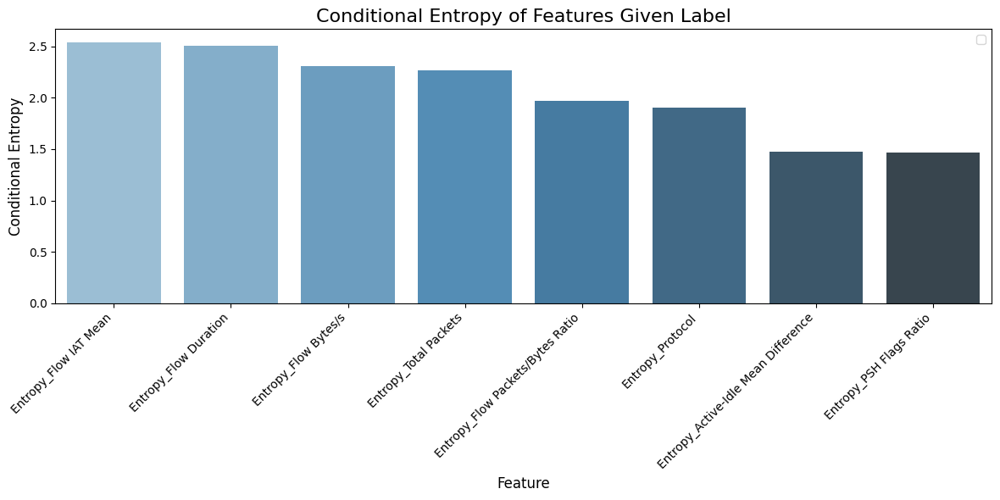

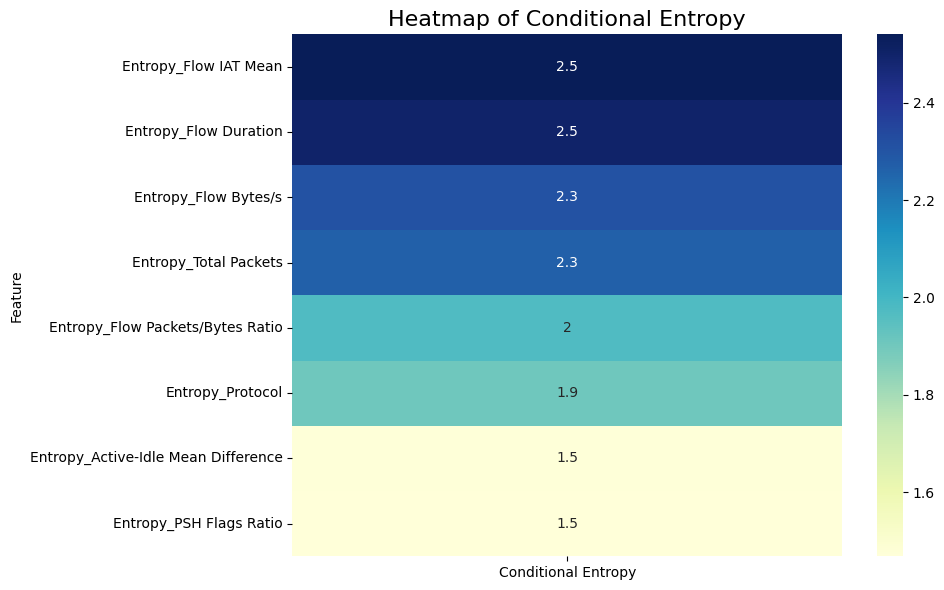

In [170]:
# 条件熵计算函数
def calculate_conditional_entropy(df, feature, label_col):
    conditional_entropy = 0
    total_count = len(df)
    grouped = df.groupby(label_col)
    
    for label, group in grouped:
        group_prob = len(group) / total_count  # P(label)
        feature_values = group[feature].dropna().values  # 移除 NaN
        
        if len(feature_values) == 0:
            continue
        
        hist, _ = np.histogram(feature_values, bins=20)
        probabilities = hist / hist.sum()
        probabilities = probabilities[probabilities > 0]
        entropy = st.entropy(probabilities)
        
        conditional_entropy += group_prob * entropy
    
    return conditional_entropy


entropy_features = [
    "Entropy_Protocol",
    "Entropy_Flow Duration",              # 連接持續時間
    "Entropy_Flow Bytes/s",               # 流量大小（比特率）
    "Entropy_Flow Packets/Bytes Ratio",   # Flow Packets/s 和 Flow Bytes/s 比值
    "Entropy_Total Packets",              # 合併 Total Fwd Packets 和 Total Backward Packets
    "Entropy_Flow IAT Mean",              # 流的到達時間均值
    "Entropy_PSH Flags Ratio",            # 數據包推送標誌比值
    "Entropy_Active-Idle Mean Difference" # 活躍與空閒時間均值差異
]
# 计算每个特征的条件熵
label_col = "Total Fwd Packets"
conditional_entropies = {
    feature: calculate_conditional_entropy(data, feature, label_col)
    for feature in entropy_features
}

# 创建 DataFrame
entropy_df = pd.DataFrame({
    "Feature": list(conditional_entropies.keys()),
    "Conditional Entropy": list(conditional_entropies.values())
})




# 计算累积熵和归一化熵
entropy_df["Cumulative Entropy"] = entropy_df["Conditional Entropy"].cumsum()
entropy_df["Normalized Entropy"] = entropy_df["Conditional Entropy"] / entropy_df["Conditional Entropy"].sum()


print(entropy_df["Normalized Entropy"] )

# 排序
order_entropy_df = entropy_df.sort_values(by="Conditional Entropy", ascending=False)



# 添加高低熵分组
threshold = entropy_df["Conditional Entropy"].median()
order_entropy_df["Entropy Group"] = order_entropy_df["Conditional Entropy"].apply(
    lambda x: "High" if x > threshold else "Low"
)

# 可视化 1：柱状图 + 累积熵曲线
plt.figure(figsize=(12, 6))
sns.barplot(
    x="Feature",
    y="Conditional Entropy",
    data=order_entropy_df,
    palette="Blues_d"
)

plt.title("Conditional Entropy of Features Given Label", fontsize=16)
plt.xlabel("Feature", fontsize=12)
plt.ylabel("Conditional Entropy", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.tight_layout()
plt.show()

# 可视化 2：热力图
plt.figure(figsize=(10, 6))
sns.heatmap(
    order_entropy_df.set_index("Feature")[["Conditional Entropy"]],
    annot=True,
    cmap="YlGnBu",
    cbar=True
)
plt.title("Heatmap of Conditional Entropy", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
def visualize_multiple_entropy_distributions(data, entropy_features, threshold_method="mean"):
    for feature in entropy_features:
        # 确定阈值
        if threshold_method == "mean":
            threshold = data[feature].mean()
        elif threshold_method == "median":
            threshold = data[feature].median()
        else:
            raise ValueError("Invalid threshold_method. Use 'mean' or 'median'.")
        
        # 高熵和低熵分组
        high_entropy = data[data[feature] > threshold][feature]
        low_entropy = data[data[feature] <= threshold][feature]

      
        # 绘制KDE图
        plt.figure(figsize=(12, 6))
        sns.kdeplot(high_entropy, color='red', label='High Entropy', fill=True, alpha=0.5)
        sns.kdeplot(low_entropy, color='blue', label='Low Entropy', fill=True, alpha=0.5)
        plt.title(f"KDE of {feature}")
        plt.xlabel("Entropy")
        plt.ylabel("Density")
        plt.legend()
        plt.tight_layout()
        plt.show()

# 示例调用
entropy_features = [
    "Entropy_Protocol",
    "Entropy_Flow Duration",
    "Entropy_Flow Bytes/s",
    "Entropy_Flow Packets/Bytes Ratio",
    "Entropy_Total Packets",
    "Entropy_Flow IAT Mean",
    "Entropy_PSH Flags Ratio",
    "Entropy_Active-Idle Mean Difference"
]
visualize_multiple_entropy_distributions(data, entropy_features)


In [224]:
# 計算每個熵特徵的斜率，並將其添加到 data 中
for feature in entropy_features:
    slope_column = f'{feature}_slope'
    print(slope_column)
    # 計算斜率
    data[slope_column] = np.gradient(data[feature].values)

# 計算每個熵特徵的斜率平均值
slope_means = {}
for feature in entropy_features:
    slope_column = f'{feature}_slope'
    slope_means[feature] = data[slope_column].mean()

# 輸出每個熵特徵的斜率平均值
for feature, mean_slope in slope_means.items():
    print(f"Mean slope for {feature}: {mean_slope}")

# 查看結果
print(data.head())



Entropy_Protocol_slope
Entropy_Flow Duration_slope
Entropy_Flow Bytes/s_slope
Entropy_Flow Packets/Bytes Ratio_slope
Entropy_Total Packets_slope
Entropy_Flow IAT Mean_slope
Entropy_PSH Flags Ratio_slope
Entropy_Active-Idle Mean Difference_slope
Mean slope for Entropy_Protocol: 1.7017890420200527e-06
Mean slope for Entropy_Flow Duration: -2.9167225746493744e-07
Mean slope for Entropy_Flow Bytes/s: -3.245593711847093e-06
Mean slope for Entropy_Flow Packets/Bytes Ratio: -7.115754083426828e-07
Mean slope for Entropy_Total Packets: 1.7051970426088393e-06
Mean slope for Entropy_Flow IAT Mean: -1.5521570188686727e-07
Mean slope for Entropy_PSH Flags Ratio: 1.0007208673363561e-06
Mean slope for Entropy_Active-Idle Mean Difference: 1.0246717688161361e-06
     Protocol  Flow Duration  Total Fwd Packets  Total Backward Packets  \
100  0.614352      -0.395226                  2                       0   
101  0.614352      -0.395226                  2                       0   
102  0.614352      

In [337]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from pyswarms.single import GlobalBestPSO
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mutual_info_score

slope_features = [
    'Entropy_Protocol_slope', 'Entropy_Flow Duration_slope', 'Entropy_Flow Bytes/s_slope',
    'Entropy_Flow Packets/Bytes Ratio_slope', 'Entropy_Total Packets_slope',
    'Entropy_Flow IAT Mean_slope', 'Entropy_PSH Flags Ratio_slope', 'Entropy_Active-Idle Mean Difference_slope'
]

all_features = slope_features

# KL 散度计算
def compute_kl_divergence(p, q):
    mask = (p != 0) & (q != 0)
    p_filtered = p[mask]
    q_filtered = q[mask]
    return np.sum(p_filtered * np.log(p_filtered / q_filtered))

# 计算变异数
def compute_variance(data):
    return np.var(data)

def compute_mutual_information(sample1, sample2):
    """
    計算兩個樣本之間的互信息
    :param sample1: 第一組樣本數據
    :param sample2: 第二組樣本數據
    :return: 互信息值
    """
    # 假設樣本是數值型的，我們需要將其離散化處理（例如，可以使用 binning）
    # 假設這裡我們簡單地將其進行等間隔離散化
    bins = 10  # 可以根據需求選擇更合適的 bin 數量
    sample1_binned = np.digitize(sample1, bins=np.linspace(min(sample1), max(sample1), bins))
    sample2_binned = np.digitize(sample2, bins=np.linspace(min(sample2), max(sample2), bins))

    # 計算離散化後的互信息
    return mutual_info_score(sample1_binned, sample2_binned)

def fitness_function(position, data, diversity_weight=5.0, consistency_weight=1.0, 
                     kl_divergence_weight=20.0, imbalance_penalty_weight=9):
    """
    分群適應度函數，目標是將資料分為高複雜度結構和低複雜度結構。
    
    參數:
    position: 粒子位置，表示分群中心點 (16維, 即兩個中心點，每個 8D)。
    data: (Nx8) 數據矩陣，每行表示一筆資料。
    diversity_weight: 權重，控制高複雜度群的多樣性貢獻 (default=1.0)。
    consistency_weight: 權重，控制低複雜度群的一致性貢獻 (default=1.0)。
    kl_divergence_weight: 權重，控制 KL 散度對目標的貢獻 (default=1.0)。
    imbalance_penalty_weight: 權重，不平衡資料群懲罰的力度 (default=0.1)。
    """
        
    # 提取兩個中心點    
    high_complexity_center, low_complexity_center = position[:8], position[8:]

    # 計算每個資料點到兩個中心的歐幾里得距離
    distances_to_high = np.linalg.norm(data - high_complexity_center, axis=1)
    distances_to_low = np.linalg.norm(data - low_complexity_center, axis=1)

    # 分配資料到距離最近的群組
    labels = np.argmin(np.vstack([distances_to_high, distances_to_low]), axis=0)
    high_complexity_group = data[labels == 0]
    low_complexity_group = data[labels == 1]

    # 防止群組為空，計算 KL 散度
    if len(high_complexity_group) > 0 and len(low_complexity_group) > 0:
        high_mean = np.mean(high_complexity_group, axis=0)
        low_mean = np.mean(low_complexity_group, axis=0)
        kl_divergence = compute_kl_divergence(high_mean, low_mean) + compute_kl_divergence(low_mean, high_mean)
    else:
        kl_divergence = 0  # 如果某群為空，KL 散度設為 0

    # 計算高複雜度群的多樣性（群內變異數總和）
    if len(high_complexity_group) > 1:
        high_diversity = np.var(high_complexity_group, axis=0).sum()
    else:
        high_diversity = 0  # 如果群組內只有一個點，多樣性設為 0

    # 計算低複雜度群的一致性（群內變異數總和）
    if len(low_complexity_group) > 1:
        low_consistency = -np.var(low_complexity_group, axis=0).sum()  # 一致性越高，變異數越低
    else:
        low_consistency = 0

    # 計算不平衡懲罰
    imbalance_penalty = abs(len(high_complexity_group) - len(low_complexity_group)) / max(len(data), 1)

    # 計算目標適應度
    fitness = (
        -kl_divergence_weight * kl_divergence  # KL 散度項，平衡兩群的分佈
        -diversity_weight * high_diversity  # 高複雜度群的多樣性
        -consistency_weight * low_consistency  # 低複雜度群的一致性
        + imbalance_penalty_weight * imbalance_penalty  # 不平衡懲罰
    )

    return fitness


# Mini-Batch 数据抽样
def get_mini_batch(X, batch_size):
    return X.sample(n=batch_size, random_state=42)

# PSO 优化
def run_kmeans_pso(X, batch_size=100):
    num_dimensions = X.shape[1] 

    kmeans = KMeans(n_clusters=2, init='k-means++', random_state=42)
    kmeans.fit(X)

    cluster_centers_shape = kmeans.cluster_centers_.shape
    lb = np.min(X.values, axis=0).tolist() * cluster_centers_shape[0]
    ub = np.max(X.values, axis=0).tolist() * cluster_centers_shape[0]

    def wrapped_fitness(position):
        return np.apply_along_axis(fitness_function, 1, position, X)
    
    
    options = {
        'c1': 1.2,
        'c2': 1.5,
        'w': 0.8,
    }
    
    optimizer = GlobalBestPSO(n_particles=90, dimensions=len(lb), options=options, bounds=(lb, ub))
    cost, pos = optimizer.optimize(wrapped_fitness, iters=50, n_processes=10)
    
    # 獲取中心點
    if len(pos) != 2 * num_dimensions:
        raise ValueError(f"Position vector length ({len(pos)}) must be twice the number of features ({2 * num_dimensions}).")

    center1, center2 = pos[:num_dimensions], pos[num_dimensions:]

    # 計算距離
    distances_to_center1 = np.linalg.norm(X.values - center1, axis=1)
    distances_to_center2 = np.linalg.norm(X.values - center2, axis=1)

    # 分群：將數據分配到距離較小的群
    labels = np.where(distances_to_center1 < distances_to_center2, 0, 1)

    # 檢查每群的大小
    cluster1_size = np.sum(labels == 0)
    cluster2_size = np.sum(labels == 1)
    print(f"Cluster 1 size: {cluster1_size}")
    print(f"Cluster 2 size: {cluster2_size}")

    return pos, cost, labels




# UMAP 可视化
def visualize_with_umap(data, labels, title="UMAP Visualization", sample_size=5000, random_state=42):
    assert len(data) == len(labels), "Data and labels must have the same length."
    if len(data) > sample_size:
        sampled_indices = np.random.RandomState(random_state).choice(len(data), size=sample_size, replace=False)
        sampled_data = data.iloc[sampled_indices]
        sampled_labels = np.array(labels)[sampled_indices]
    else:
        sampled_data = data
        sampled_labels = labels

    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, n_jobs=-1, random_state=random_state)
    data_2d = reducer.fit_transform(sampled_data)

    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=data_2d[:, 0], y=data_2d[:, 1], hue=sampled_labels, palette="viridis", alpha=0.7)
    plt.title(title)
    plt.xlabel("UMAP Dimension 1")
    plt.ylabel("UMAP Dimension 2")
    plt.show()



Ｘ = data[all_features] 

# 执行优化
optimized_centers, cost, optimized_labels = run_kmeans_pso(X, batch_size=100)


data['Cluster_Label'] = optimized_labels

# UMAP 可视化
visualize_with_umap(data[all_features], data['Cluster_Label'], title="UMAP Visualization (Optimized Clusters)")

import numpy as np
from scipy.stats import entropy

def evaluate_clustering(data, labels, features):
    # 分群
    high_complexity = data[labels == 1][features]
    low_complexity = data[labels == 0][features]

    # 計算 KL 散度
    kl_divergence = entropy(
        np.mean(high_complexity, axis=0), 
        np.mean(low_complexity, axis=0)
    )

    # 計算群內方差
    high_variance = np.var(high_complexity.values, axis=0).mean()
    low_variance = np.var(low_complexity.values, axis=0).mean()

    # 計算群體平均值
    high_mean = np.mean(high_complexity.values, axis=0)
    low_mean = np.mean(low_complexity.values, axis=0)

    # 打印結果
    print(f"High Complexity:")
    print(f"  Mean: {high_mean}")
    print(f"  KL Divergence: {kl_divergence}")
    print(f"  Variance: {high_variance}")
    print()
    print(f"Low Complexity:")
    print(f"  Mean: {low_mean}")
    print(f"  KL Divergence: {-kl_divergence}")  # 負 KL 表示方向相反
    print(f"  Variance: {low_variance}")


evaluate_clustering(data, data['Cluster_Label'].values, all_features)


2024-12-23 19:23:55,294 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 1.2, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best:   0%|          |0/50


AttributeError: Can't get local object 'run_kmeans_pso.<locals>.wrapped_fitness'

</code></div></div></pre><hr><h3>如何閱讀這張圖？ 📊</h3><ul><li><p><strong>Y 軸 (Conditional Entropy)</strong>：表示每個特徵在給定 <strong>Label</strong> 的條件下的「資訊不確定性」。</p><ul><li><strong>值越低</strong>：表示該特徵在 Label 條件下的變異較小，與 Label 關聯較強，對分類更有幫助。</li><li><strong>值越高</strong>：表示該特徵的變異大，資訊不確定性高，與 Label 關聯性較低。</li></ul></li><li><p><strong>X 軸 (Feature)</strong>：每個計算熵的特徵。</p></li><li><p><strong>高度比較</strong>：</p><ul><li><strong>最低條件熵的特徵</strong>（如 <code>Entropy_Protocol</code> 和 <code>Entropy_PSH Flags Ratio</code>）：<ul><li>在圖中柱狀圖高度接近 0，表示這些特徵與 Label 的關聯性很強。</li><li><strong>解讀</strong>：它們可能是分類問題中最具鑑別力的特徵。</li></ul></li><li><strong>最高條件熵的特徵</strong>（如 <code>Entropy_Source Port</code> 和 <code>Entropy_Flow Duration</code>）：<ul><li>柱狀圖高度較高，表示這些特徵的資訊不確定性大，區分 Label 的能力相對較弱。</li></ul></li></ul></li><li><p><strong>中等高度的特徵</strong>：<br>這類特徵（如 <code>Entropy_Flow Packets/Bytes Ratio</code> 和 <code>Entropy_Active-Idle Mean Difference</code>）具有一定的資訊價值，但仍存在較高的不確定性。</p></li></ul><hr><h3>結論 📝</h3><ul><li><strong>低條件熵特徵</strong>：應被優先考慮用於分類或模型訓練，因為它們攜帶較高的資訊量。</li><li><strong>高條件熵特徵</strong>：可以視情況進行篩選或降維處理。</li><li>這張圖幫助快速視覺化不同特徵的重要性，進一步做出特徵選擇決策。</li></ul></div>

# 可視化

用PCA 去看 2D and 3D

In [4]:

from sklearn.metrics import mutual_info_score
from scipy.stats import entropy
import numpy as np

import matplotlib.pyplot as plt
import numpy as np

def visualize_statistics_with_mi(stats):
    features = list(stats.keys())
    benign_means = [stats[f]["Benign Mean"] for f in features]
    attack_means = [stats[f]["Attack Mean"] for f in features]
    kl_divergences = [stats[f]["KL Divergence"] for f in features]
    mutual_informations = [stats[f]["Mutual Information"] for f in features]

    x = np.arange(len(features))  # X 轴的位置
    width = 0.35  # 柱状图宽度

    # 图 1: Benign vs Attack 平均值
    plt.figure(figsize=(12, 6))
    plt.bar(x - width / 2, benign_means, width, label='Benign Mean', color='green', alpha=0.7)
    plt.bar(x + width / 2, attack_means, width, label='Attack Mean', color='red', alpha=0.7)
    plt.xticks(x, features, rotation=45, ha="right")
    plt.title("Mean Comparison: Benign vs Attack")
    plt.xlabel("Features")
    plt.ylabel("Mean")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 图 2: KL Divergence
    plt.figure(figsize=(12, 6))
    plt.bar(features, kl_divergences, color='blue', alpha=0.7)
    plt.xticks(rotation=45, ha="right")
    plt.title("KL Divergence per Feature")
    plt.xlabel("Features")
    plt.ylabel("KL Divergence")
    plt.tight_layout()
    plt.show()

    # 图 3: Mutual Information (散点图)
    plt.figure(figsize=(12, 6))
    plt.scatter(features, mutual_informations, color='purple', s=100, alpha=0.7)
    for i, mi in enumerate(mutual_informations):
        plt.text(i, mi + 0.02, f"{mi:.2f}", ha='center', va='bottom', fontsize=9)
    plt.xticks(rotation=45, ha="right")
    plt.title("Mutual Information per Feature")
    plt.xlabel("Features")
    plt.ylabel("Mutual Information")
    plt.tight_layout()
    plt.show()



def calculate_statistics_with_mi(data, features, label_column, benign_label, attack_label):
    stats = {}
    
    for feature in features:
        # 提取 Benign 和 Attack 的分布
        benign_data = data[data[label_column] == benign_label][feature]
        attack_data = data[data[label_column] == attack_label][feature]
        
        # 计算均值和均方根
        benign_mean = np.mean(benign_data)
        benign_rms = np.sqrt(np.mean(benign_data**2))
        
        attack_mean = np.mean(attack_data)
        attack_rms = np.sqrt(np.mean(attack_data**2))
        
        # 计算KL散度
        benign_hist, bin_edges = np.histogram(benign_data, bins=30, density=True)
        attack_hist, _ = np.histogram(attack_data, bins=bin_edges, density=True)
        
        benign_hist += 1e-10
        attack_hist += 1e-10
        
        kl_divergence = entropy(benign_hist, attack_hist)
        
        # 合并数据集并生成分类标签
        combined_data = np.concatenate([benign_data, attack_data])
        labels = np.concatenate([np.zeros(len(benign_data)), np.ones(len(attack_data))])
        
        # 计算互惠信息量
        mutual_information = mutual_info_score(
            np.digitize(combined_data, bin_edges),  # 数据分桶
            labels                                  # 标签
        )
        
        # 保存统计结果
        stats[feature] = {
            "Benign Mean": benign_mean,
            "Benign RMS": benign_rms,
            "Attack Mean": attack_mean,
            "Attack RMS": attack_rms,
            "KL Divergence": kl_divergence,
            "Mutual Information": mutual_information,
        }
    
    return stats


all_features = [
    "Entropy_Protocol",
    "Entropy_Flow Duration",              # 連接持續時間
    "Entropy_Flow Bytes/s",               # 流量大小（比特率）
    "Entropy_Flow Packets/Bytes Ratio",   # Flow Packets/s 和 Flow Bytes/s 比值
    "Entropy_Total Packets",              # 合併 Total Fwd Packets 和 Total Backward Packets
    "Entropy_Flow IAT Mean",              # 流的到達時間均值
    "Entropy_PSH Flags Ratio",            # 數據包推送標誌比值
    "Entropy_Active-Idle Mean Difference" # 活躍與空閒時間均值差異
]

# 计算并显示结果
statistics_with_mi = calculate_statistics_with_mi(data[100:], all_features, "Label", BEGIN_LABEL, DDOS_LABEL)
print()
visualize_statistics_with_mi(statistics_with_mi)


NameError: name 'BEGIN_LABEL' is not defined

# 熵分類計算


1. PSO
2. SA

在您的情境中，KL 散度被用來衡量 DDoS 攻擊流量和正常流量之間的概率分佈差異。如果 KL 散度較大，表示攻擊流量和正常流量在特徵分佈上差異顯著，因此該特徵對攻擊識別具有較強的區分能力。



In [5]:
# func 功能
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from pyswarms.single import GlobalBestPSO
import umap.umap_ as umap
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mutual_info_score
from sklearn_extra.cluster import KMedoids
import numpy as np
from sklearn.metrics import mutual_info_score


# Mini-Batch 資料抽樣
def get_mini_batch(X_clean, batch_size):
    return X_clean.sample(n=batch_size, random_state=42)

# 計算 KL 散度
def compute_kl_divergence(p, q):
    mask = (p != 0) & (q != 0)
    p_filtered = p[mask]
    q_filtered = q[mask]
    return np.sum(p_filtered * np.log(p_filtered / q_filtered))

# 計算變異數
def compute_variance(data):
    return np.var(data)


def compute_mutual_info(features, reference_distribution=None, bins=5):

    # 確保 features 是一維數組
    features = np.array(features).flatten()

    # 分箱處理
    discrete_features, bin_edges = np.histogram(features, bins=bins)
    discrete_features = np.digitize(features, bins=bin_edges, right=True)

    # 如果未提供 reference_distribution，默認使用均勻分布
    if reference_distribution is None:
        reference_distribution = np.ones(len(discrete_features)) / len(discrete_features)

    # 將 reference_distribution 轉換為與離散特徵對應的離散分布
    reference_bins = np.digitize(reference_distribution, bins=bin_edges, right=True)

    # 計算互信息
    mutual_info = mutual_info_score(discrete_features, reference_bins)

    return mutual_info


def simulated_annealing(position, fitness_func, bounds, temperature=1000, cooling_rate=0.95, max_iter=100):
    best_position = position.copy()
    best_cost = fitness_func(position)
    
    current_position = position.copy()
    current_cost = best_cost

    for _ in range(max_iter):
        # 在附近生成一个新解
        new_position = current_position + np.random.uniform(-1, 1, size=current_position.shape) * temperature
        new_position = np.clip(new_position, bounds[0], bounds[1])  # 确保新解在范围内

        # 计算新解的适应度
        new_cost = fitness_func(new_position)

        # 根据概率接受新解
        if new_cost < current_cost or np.random.rand() < np.exp(-(new_cost - current_cost) / temperature):
            current_position = new_position
            current_cost = new_cost

            # 更新全局最佳解
            if new_cost < best_cost:
                best_position = new_position
                best_cost = new_cost

        # 降低温度
        temperature *= cooling_rate

    return best_position, best_cost


def visualize_with_umap(data, labels, title="UMAP Visualization", sample_size=5000, random_state=42):
    """
    可視化資料使用 UMAP，加入隨機採樣以處理大量資料。
    
    Parameters:
    - data (DataFrame or ndarray): 原始數據。
    - labels (array-like): 分群標籤。
    - title (str): 圖片標題。
    - sample_size (int): 最大採樣數量，預設為 5000。
    - random_state (int): 隨機種子，確保結果一致性。
    """
    # 確保數據和標籤是一致的長度
    assert len(data) == len(labels), "Data and labels must have the same length."
    
    # 如果資料量大於採樣大小，執行隨機採樣
    if len(data) > sample_size:
        sampled_indices = np.random.RandomState(random_state).choice(len(data), size=sample_size, replace=False)
        sampled_data = data.iloc[sampled_indices]  # 使用 .iloc 進行行索引
        sampled_labels = np.array(labels)[sampled_indices]
    else:
        sampled_data = data
        sampled_labels = labels
    
    # 使用 UMAP 進行降維
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, n_jobs=-1, random_state=random_state)
    data_2d = reducer.fit_transform(sampled_data)
    
    # 視覺化結果variance_weight_low
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=data_2d[:, 0], y=data_2d[:, 1], hue=sampled_labels, palette="viridis", alpha=0.7)
    plt.title(title)
    plt.xlabel("UMAP Dimension 1")
    plt.ylabel("UMAP Dimension 2")
    plt.show()

def compute_cluster_metrics(data, cluster_centers, high_complexity_features, low_complexity_features):
    # 高複雜度群組
    high_data = data[data['Complexity_Label'] == "High Complexity"]
    high_values = high_data[high_complexity_features].values
    
    high_kl = compute_kl_divergence(
        np.mean(high_values, axis=0),
        np.ones(len(high_complexity_features)) / len(high_complexity_features)
    )
    high_variance = compute_variance(high_values)
    high_mi = compute_mutual_info(high_values.flatten())

    # 低複雜度群組
    low_data = data[data['Complexity_Label'] == "Low Complexity"]
    low_values = low_data[low_complexity_features].values
    
    low_kl = compute_kl_divergence(
        np.mean(low_values, axis=0),
        np.ones(len(low_complexity_features)) / len(low_complexity_features)
    )
    low_variance = compute_variance(low_values)

    return {
        "High Complexity": {"KL Divergence": high_kl, "Variance": high_variance, "Mutual Info": high_mi},
        "Low Complexity": {"KL Divergence": low_kl, "Variance": low_variance}
    }
    


In [ ]:
def fitness_function(x, high_complexity_features, low_complexity_features):  
    balance_penalty_weight=70
    target_ratio=0.2
    penalty_sensitivity=80
    # 權重設置
    kl_weight_high = 8.0  # 高複雜度 KL 散度權重
    variance_weight_high = 1.0  # 高複雜度變異數權重
    # mi_weight_high = 3.0  # 高複雜度互信息權重

    kl_weight_low = 1.0  # 低複雜度 KL 散度權重（目標降低）
    variance_weight_low = 1.0  # 低複雜度變異數權重（目標降低）

    
    # kl_weight_high = 20.0  # 高複雜度 KL 散度權重
    # variance_weight_high = 5.0  # 高複雜度變異數權重
    # # mi_weight_high = 3.0  # 高複雜度互信息權重

    # kl_weight_low = 5.0  # 低複雜度 KL 散度權重（目標降低）
    # variance_weight_low = 15.0  # 低複雜度變異數權重（目標降低）

    cluster_centers = x.reshape(2, -1)  # 假設兩個群組
    high_complexity_center = cluster_centers[0]
    low_complexity_center = cluster_centers[1]

    high_indices = [all_features.index(feature) for feature in high_complexity_features]
    low_indices = [all_features.index(feature) for feature in low_complexity_features]

    # 高複雜度適應度 (需要高 KL 散度、高變異數、高互信息)
    high_kl_div = compute_kl_divergence(
        high_complexity_center[high_indices],
        np.ones(len(high_complexity_features)) / len(high_complexity_features),
    )
    high_variance = compute_variance(high_complexity_center[high_indices])
    # high_mutual_info = compute_mutual_info(high_complexity_center[high_indices])

    high_fitness = (
        kl_weight_high * high_kl_div +
        variance_weight_high * high_variance
        # mi_weight_high * high_mutual_info
    )

    # 低複雜度適應度 (需要低 KL 散度、低變異數)
    low_kl_div = compute_kl_divergence(
        low_complexity_center[low_indices],
        np.ones(len(low_complexity_features)) / len(low_complexity_features),
    )
    low_variance = compute_variance(low_complexity_center[low_indices])

    low_fitness = (
        -kl_weight_low * low_kl_div -
        variance_weight_low * low_variance
    )

    # 計算群組大小差異並加上平衡性懲罰
    high_group_size = len(high_complexity_features)  # 高複雜度特徵數量
    low_group_size = len(low_complexity_features)    # 低複雜度特徵數量

    total_size = high_group_size + low_group_size
    target_high_size = total_size * target_ratio  # 根據目標比例計算高複雜度群組的理想大小
    target_low_size = total_size * (1 - target_ratio)  # 根據目標比例計算低複雜度群組的理想大小

    # 計算群組大小偏離比例
    high_diff_ratio = ((high_group_size - target_high_size) / target_high_size) ** 2
    low_diff_ratio = ((low_group_size - target_low_size) / target_low_size) ** 2

    # 總平衡懲罰：加大偏離比例的懲罰
    balance_penalty = (high_diff_ratio + low_diff_ratio) * penalty_sensitivity

    # 總適應度，加入平衡性懲罰
    total_fitness = -(high_fitness + low_fitness) + balance_penalty_weight * balance_penalty

    return total_fitness




In [ ]:
# signle pso
def run_kmeans_pso(X_clean, high_complexity_features, low_complexity_features, batch_size=100):
    kmeans = KMeans(n_clusters=2, random_state=42, init="k-means++")
    kmeans.fit(X_clean)

    cluster_centers_shape = kmeans.cluster_centers_.shape
    lb = np.min(X_clean.values, axis=0).tolist() * cluster_centers_shape[0]
    ub = np.max(X_clean.values, axis=0).tolist() * cluster_centers_shape[0]

    def wrapped_fitness(x):
        return np.apply_along_axis(
            fitness_function, 1, x, high_complexity_features, low_complexity_features
        )
    max_iter = 600
    n_particles = 500
    dimensions = len(lb)

    options = dynamic_options(0, max_iter)  # 初始化參數
    optimizer = GlobalBestPSO(
        n_particles=n_particles, dimensions=dimensions, options=options, bounds=(lb, ub)
    )

    def dynamic_fitness(iter):
        # 動態更新 options
        new_options = dynamic_options(iter, max_iter)
        optimizer.options = new_options
        # 適應度計算
        return wrapped_fitness(optimizer.swarm.position)

    # 執行優化
    cost, pos = optimizer.optimize(dynamic_fitness, iters=max_iter)
    return pos.reshape(cluster_centers_shape), cost


2024-12-26 18:04:37,299 - pyswarms.single.global_best - INFO - Optimize for 1 iters with {'c1': 1.2, 'c2': 1.5, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|1/1, best_cost=7.15e+3
2024-12-26 18:04:37,375 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 7148.749399025158, best pos: [0.98211886 2.87804015 1.8190767  0.06249604 0.94960436 2.17865129
 0.73882368 0.73698485]
/var/folders/sq/hg8np8js4x92j1nx8y_mlls80000gn/T/ipykernel_80766/1749977271.py:24: RuntimeWarning: invalid value encountered in log
  return np.sum(p_filtered * np.log(p_filtered / q_filtered))
2024-12-26 18:04:37,783 - pyswarms.single.global_best - INFO - Optimize for 1 iters with {'c1': array([[1.20004829, 1.2003993 , 1.20008478, ..., 1.20044592, 1.20036424,
        1.20044073],
       [1.20003973, 1.20003645, 1.20011802, ..., 1.20022906, 1.20016943,
        1.20021234],
       [1.20015557, 1.20001575, 1.20036851, ..., 1.20043503, 1.20012768,
        1.20018066],
       ...,
       [

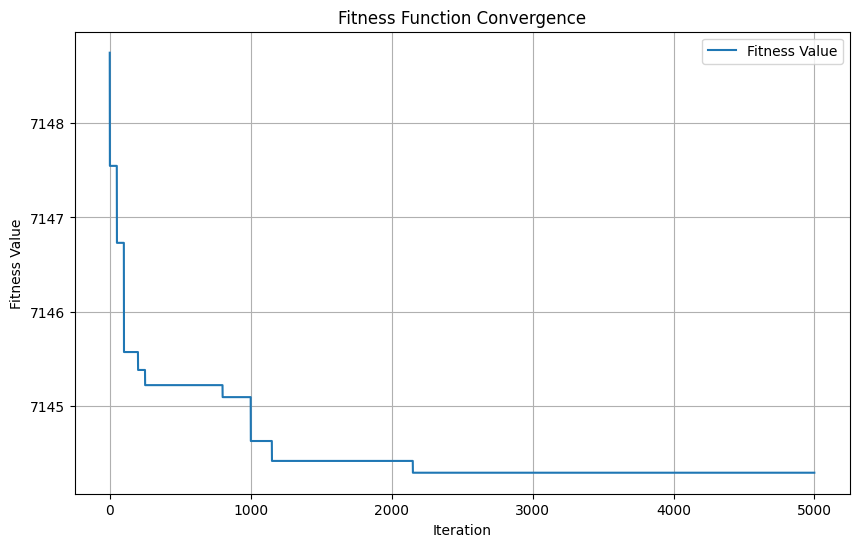

Complexity_Label
Low Complexity     407841
High Complexity     23430
Name: count, dtype: int64
High Complexity:
  KL Divergence: 3.123646425515918
  Variance: 1.4133435286741467
  Mutual Info: 0.0
Low Complexity:
  KL Divergence: 0.9914864921838566
  Variance: 0.5444392710443419

Normal Data Label Counts:
Label
DDoS      23419
Benign       11
Name: count, dtype: int64

Anomalous Data Label Counts:
Label
DDoS      310021
Benign     97820
Name: count, dtype: int64


/var/folders/sq/hg8np8js4x92j1nx8y_mlls80000gn/T/ipykernel_80766/3215691095.py:185: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Complexity_Label'] = optimized_labels


In [ ]:

# 主程序
high_complexity_features = ['Entropy_Protocol', 'Entropy_Flow Packets/Bytes Ratio',]
low_complexity_features = ['Entropy_Flow Duration', 'Entropy_Flow Bytes/s']
all_features = high_complexity_features + low_complexity_features



def wrapped_fitness(x, high_complexity_features, low_complexity_features):
    return np.apply_along_axis(
        fitness_function, 1, x, high_complexity_features, low_complexity_features
    )
    
def dynamic_options(iter, max_iter):
    w_max, w_min = 0.9, 0.4
    c1_initial, c1_final = 1.2, 2.0
    c2_initial, c2_final = 1.5, 0.5

    w = w_max - (w_max - w_min) * (iter / max_iter)
    c1 = c1_initial + (c1_final - c1_initial) * (iter / max_iter)
    c2 = c2_initial - (c2_initial - c2_final) * (iter / max_iter)

    return {'c1': c1, 'c2': c2, 'w': w}

def orthogonal_learning(swarm, fitness_func, lb, ub, num_points=10):
    """
    正交学习方法。
    :param swarm: 当前粒子群。
    :param fitness_func: 适应度函数。
    :param lb: 搜索空间的下界。
    :param ub: 搜索空间的上界。
    :param num_points: 每个粒子生成的正交学习点数。
    :return: 更新后的粒子群。
    """
    num_particles, dimensions = swarm.position.shape

    # 遍历每个粒子，应用正交学习
    for i in range(num_particles):
        # 当前粒子的搜索空间
        current_pos = swarm.position[i]
        step_size = (ub - lb) / num_points

        # 正交实验点
        orthogonal_points = [
            current_pos + (np.random.randint(-1, 2, size=dimensions) * step_size)
            for _ in range(num_points)
        ]

        # 评估正交实验点的适应度
        fitness_scores = [fitness_func(p) for p in orthogonal_points]

        # 更新粒子位置为适应度最优的点
        best_point = orthogonal_points[np.argmin(fitness_scores)]
        if fitness_func(best_point) < fitness_func(current_pos):
            swarm.position[i] = best_point  # 更新为更优位置

    return swarm


def apply_mutation(swarm, mutation_probability, lb, ub):
    """对粒子群应用变异算子."""
    n_particles, dimensions = swarm.position.shape
    
    # 随机选择需要变异的粒子
    mutation_mask = np.random.rand(n_particles) < mutation_probability
    
    # 遍历每个粒子
    for i in range(n_particles):
        if mutation_mask[i]:
            # 随机选择变异方式
            if np.random.rand() < 0.5:
                # 随机重置法
                swarm.position[i] = np.random.uniform(lb, ub, size=dimensions)
            else:
                # 高斯扰动法
                mutation_scale = 0.1 * (ub - lb)  # 控制扰动幅度
                swarm.position[i] += np.random.normal(0, mutation_scale, size=dimensions)
                swarm.position[i] = np.clip(swarm.position[i], lb, ub)  # 确保粒子在边界内
    return swarm


def run_pso_with_sa(X_clean, high_complexity_features, low_complexity_features):
    # 初始化 KMeans 并进行聚类，使用 2 个聚类中心
    kmeans = KMeans(n_clusters=2, random_state=42, init="k-means++")
    kmeans.fit(X_clean)

    # 获取聚类中心的形状 (行列数)
    cluster_centers_shape = kmeans.cluster_centers_.shape

    # 计算搜索空间的下界 (lb) 和上界 (ub)，基于特征的最小值和最大值
    lb = np.min(X_clean.values, axis=0)  # NumPy 数组
    ub = np.max(X_clean.values, axis=0)  # NumPy 数组

    lb = np.tile(lb, cluster_centers_shape[0])  # 扩展维度
    ub = np.tile(ub, cluster_centers_shape[0])  # 扩展维度

    # 包装适应度函数，对每个粒子计算适应度
    def wrapped_fitness(x):
        return np.apply_along_axis(
            fitness_function, 1, x, high_complexity_features, low_complexity_features
        )
    
    # 设置 PSO 的最大迭代次数
    max_iter = 5000
    n_particles = 1000
    mutation_probability = 0.15  # 变异概率

    fitness_values = []

    # 设置搜索空间的维度
    dimensions = len(lb)

    # 初始化动态参数选项
    options = dynamic_options(0, max_iter)

    # 初始化 PSO 优化器
    optimizer = GlobalBestPSO(
        n_particles=n_particles, dimensions=dimensions, options=options, bounds=(lb, ub)
    )

    # 动态适应度函数
    def dynamic_fitness(iter):
        new_options = dynamic_options(iter, max_iter)
        optimizer.options = new_options
        return wrapped_fitness(optimizer.swarm.position)

    # 主循环
    for iter in range(max_iter):
        cost, pos = optimizer.optimize(dynamic_fitness, iters=1)

        fitness_values.append(cost)

        # 应用变异算子

        if iter < max_iter * 0.5 and iter % 50 == 0:
            # 前期使用正交学习
            optimizer.swarm = orthogonal_learning(optimizer.swarm, lambda x: fitness_function(x, high_complexity_features, low_complexity_features), lb, ub)
        elif iter >= max_iter * 0.5 and iter % 20 == 0:
            # 后期使用变异增加局部搜索
            optimizer.swarm = apply_mutation(optimizer.swarm, mutation_probability, lb, ub)

        # 每隔 40 次迭代执行模拟退火
        if iter % 40 == 0:
            sa_position, sa_cost = simulated_annealing(
                pos, lambda x: fitness_function(x, high_complexity_features, low_complexity_features),
                bounds=(lb, ub),
                temperature=200, cooling_rate=0.9, max_iter=80
            )
            if sa_cost < cost:
                optimizer.swarm.position = np.tile(sa_position, (n_particles, 1))
                optimizer.swarm.best_pos = sa_position
                optimizer.swarm.best_cost = sa_cost

    # 最终优化
    final_cost, final_pos = optimizer.optimize(dynamic_fitness, iters=max_iter - iter)
    
    # 绘制收敛曲线
    plt.figure(figsize=(10, 6))
    plt.plot(fitness_values, label='Fitness Value')
    plt.title('Fitness Function Convergence')
    plt.xlabel('Iteration')
    plt.ylabel('Fitness Value')
    plt.legend()
    plt.grid()
    plt.show()
    
    return final_pos.reshape(cluster_centers_shape), final_cost

# 執行優化


# 示例數據
X = data[all_features]

optimized_centers, cost = run_pso_with_sa(X, high_complexity_features, low_complexity_features)

# 計算分群標籤
optimized_labels = []
for i in range(len(X)):
    point = X.iloc[i].values
    high_distance = np.linalg.norm(point - optimized_centers[0])
    low_distance = np.linalg.norm(point - optimized_centers[1])
    optimized_labels.append("High Complexity" if high_distance < low_distance else "Low Complexity")

# 添加分群標籤到 DataFrame
X['Complexity_Label'] = optimized_labels

print(X['Complexity_Label'].value_counts())


cluster_metrics = compute_cluster_metrics(X, optimized_centers, high_complexity_features, low_complexity_features)
for group, metrics in cluster_metrics.items():
    print(f"{group}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value}")
# 使用 UMAP 可視化

# visualize_with_umap(X[all_features], X['Complexity_Label'], title="UMAP Visualization (Optimized Clusters)")


data['Complexity_Label'] = X['Complexity_Label']
    
df_normal = data[data['Complexity_Label'] == 'High Complexity']
df_anomalous = data[data['Complexity_Label'] == 'Low Complexity']
# 計算每個 Label 在各類別中的數量
normal_label_counts = df_normal['Label'].value_counts()
anomalous_label_counts = df_anomalous['Label'].value_counts()
# 顯示標籤數量
print("\nNormal Data Label Counts:")
print(normal_label_counts)
print("\nAnomalous Data Label Counts:")
print(anomalous_label_counts)





# 計算熵分佈決定分類質量

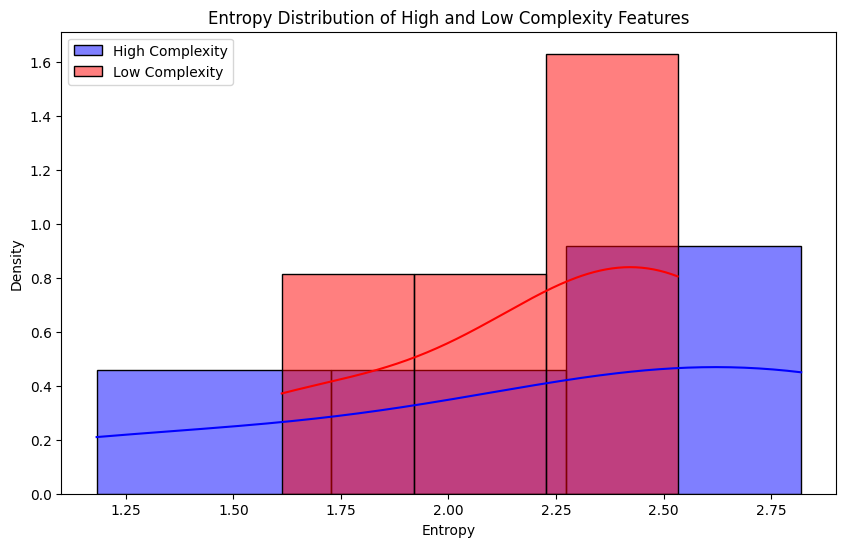

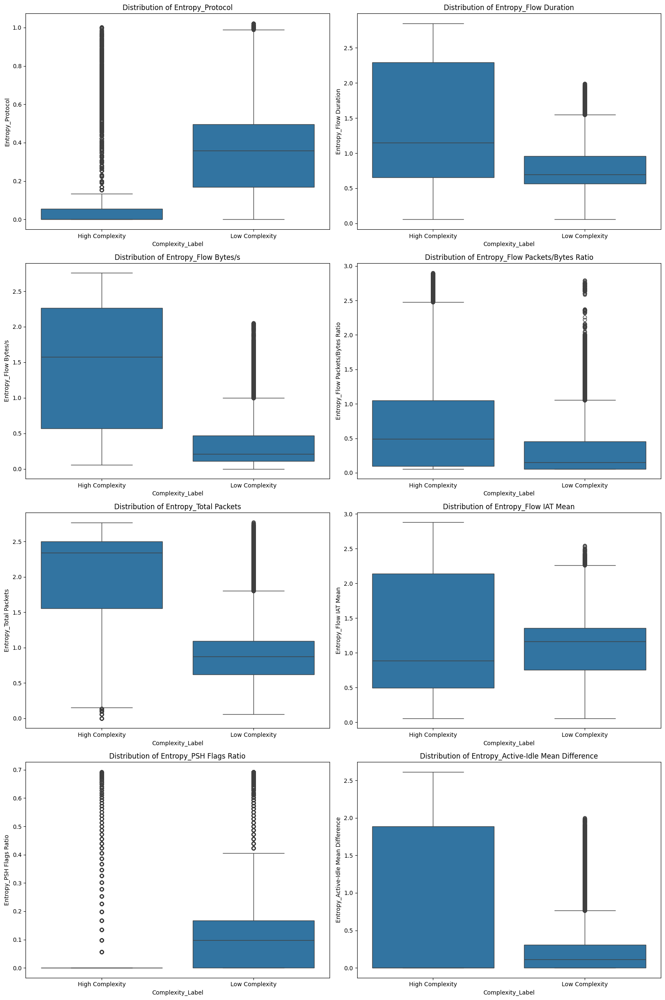

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import entropy
import matplotlib.pyplot as plt
import seaborn as sns

# 假設數據
high_complexity_features = ['Entropy_Protocol', 'Entropy_Flow Packets/Bytes Ratio']
low_complexity_features = ['Entropy_Flow Duration', 'Entropy_Flow Bytes/s']
all_features = high_complexity_features + low_complexity_features


# 選擇高複雜度和低複雜度的特徵
high_complexity_features = data[data['Complexity_Label'] == "High Complexity"][all_features]
low_complexity_features = data[data['Complexity_Label'] == "Low Complexity"][all_features]

# 計算熵
def compute_entropy(features):
    # 計算每個特徵的熵
    entropy_values = {col: entropy(np.histogram(features[col], bins=20, density=True)[0]) for col in features.columns}
    return entropy_values

# 計算高複雜度和低複雜度特徵的熵
high_complexity_entropy = compute_entropy(high_complexity_features)
low_complexity_entropy = compute_entropy(low_complexity_features)

# 合併熵值並計算總熵
all_entropy = pd.DataFrame({
    'High Complexity Entropy': high_complexity_entropy,
    'Low Complexity Entropy': low_complexity_entropy
})

# 計算每個特徵的總熵
all_entropy['Total Entropy'] = all_entropy.mean(axis=1)

# 顯示熵分佈

# 可視化熵分佈
plt.figure(figsize=(10, 6))
sns.histplot(all_entropy['High Complexity Entropy'], color='blue', kde=True, label='High Complexity', stat='density')
sns.histplot(all_entropy['Low Complexity Entropy'], color='red', kde=True, label='Low Complexity', stat='density')
plt.title('Entropy Distribution of High and Low Complexity Features')
plt.xlabel('Entropy')
plt.ylabel('Density')
plt.legend()
plt.show()

all_features = [ "Entropy_Protocol",
    "Entropy_Flow Duration",
    "Entropy_Flow Bytes/s",
    "Entropy_Flow Packets/Bytes Ratio",
    "Entropy_Total Packets",
    "Entropy_Flow IAT Mean",
    "Entropy_PSH Flags Ratio",
    "Entropy_Active-Idle Mean Difference"]

# 設置一行顯示兩個圖
n_features = len(all_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols  # 計算需要幾行

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))

# 繪製每個特徵的分佈
for i, feature in enumerate(all_features):
    row, col = divmod(i, n_cols)
    sns.boxplot(data=data, x='Complexity_Label', y=feature, ax=axes[row, col])
    axes[row, col].set_title(f"Distribution of {feature}")

# 移除多餘的子圖
if n_features % n_cols != 0:
    for j in range(n_features, n_rows * n_cols):
        fig.delaxes(axes.flat[j])

# 調整佈局
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 合併所有特徵
all_features = slope_features

# 創建一個空的 DataFrame 用來儲存分佈數據
distributions = pd.DataFrame()

# 對於每個特徵，根據標籤（高複雜度或低複雜度）提取並繪製其分佈
for feature in all_features:
    # 提取高複雜度和低複雜度的數據
    high_complexity_data = data[data['Cluster_Label'] == 1][feature]
    low_complexity_data = data[data['Cluster_Label'] == 0][feature]
    
    # 合併數據以便繪圖
    feature_data = pd.DataFrame({
        'High Complexity': high_complexity_data,
        'Low Complexity': low_complexity_data
    })
    
    # 將數據加入 distributions DataFrame
    distributions[feature] = feature_data.mean(axis=1)

    # 繪製分佈圖
    plt.figure(figsize=(10, 6))
    sns.histplot(high_complexity_data, color='blue', kde=True, label='High Complexity', stat='density', bins=20)
    sns.histplot(low_complexity_data, color='red', kde=True, label='Low Complexity', stat='density', bins=20)
    plt.title(f'Distribution of {feature} (High vs Low Complexity)')
    plt.xlabel(f'{feature}')
    plt.ylabel('Density')
    plt.legend()
    plt.show()


底下圖表可以看到

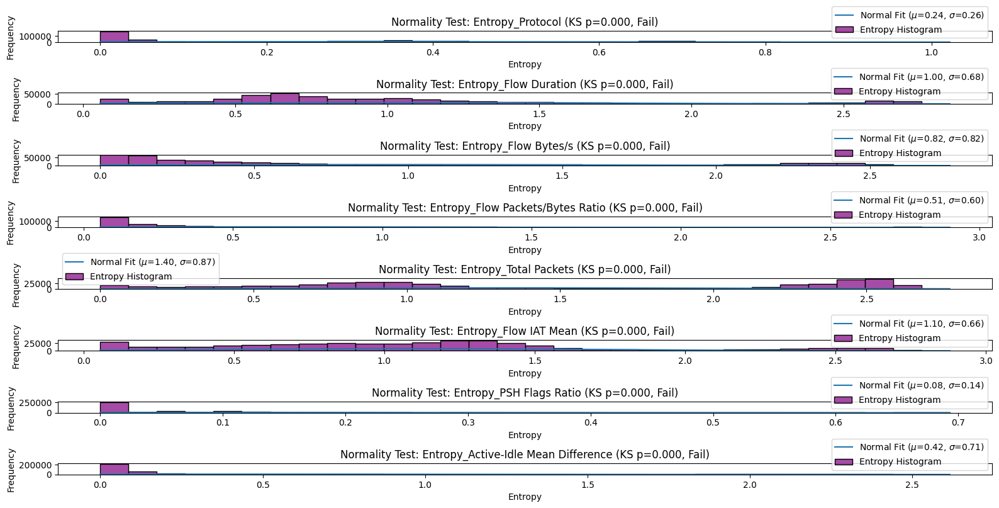

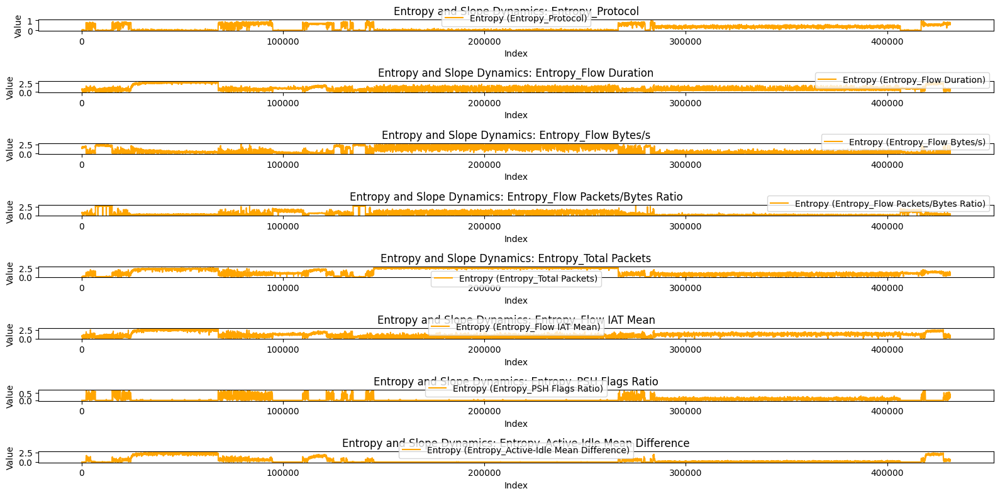

Entropy_Protocol: μ=0.24, σ=0.26, Low<-0.02, High>0.50
Entropy_Flow Duration: μ=1.00, σ=0.68, Low<0.32, High>1.68
Entropy_Flow Bytes/s: μ=0.82, σ=0.82, Low<0.00, High>1.64
Entropy_Flow Packets/Bytes Ratio: μ=0.51, σ=0.60, Low<-0.09, High>1.12
Entropy_Total Packets: μ=1.40, σ=0.87, Low<0.53, High>2.27
Entropy_Flow IAT Mean: μ=1.10, σ=0.66, Low<0.44, High>1.76
Entropy_PSH Flags Ratio: μ=0.08, σ=0.14, Low<-0.06, High>0.23
Entropy_Active-Idle Mean Difference: μ=0.42, σ=0.71, Low<-0.29, High>1.13
Entropy Anomaly Proportions:
                                     Low_Proportion  High_Proportion
Entropy_Protocol                           0.000000         0.183506
Entropy_Flow Duration                      0.100531         0.136856
Entropy_Flow Bytes/s                       0.001013         0.208359
Entropy_Flow Packets/Bytes Ratio           0.000000         0.158223
Entropy_Total Packets                      0.170749         0.314359
Entropy_Flow IAT Mean                      0.163691         

In [256]:
visualize_normality(data, entropy_features)
visualize_entropy_and_slope(data, entropy_features)
entropy_statistic_data_ = classify_entropy_statistically(data, entropy_features)
entropy_anomaly_analysis(entropy_statistic_data_, entropy_features)

In [367]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.impute import SimpleImputer

# 假設 entropy_features 是包含熵特徵的列名
# 假設 ntropy_df["Normalized Entropy"] 是對應熵特徵的標準化熵值
# ntropy_df 應該包含與 df[entropy_features] 對應的列順序
print(entropy_df["Normalized Entropy"])
# 計算熵的倒數權重
weights = 1 / entropy_df["Normalized Entropy"].values

# 確保權重的數值穩定（防止熵為零）
weights = np.nan_to_num(weights, nan=0.0, posinf=0.0, neginf=0.0)

# 對原始數據應用權重
X_entropy = data[entropy_features].copy()

# 1. 處理缺失值
imputer = SimpleImputer(strategy='mean')
X_entropy_filled = imputer.fit_transform(X_entropy)

# 2. 按權重加權數據
X_entropy_weighted = X_entropy_filled * weights

# 3. 標準化數據
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_entropy_weighted)

# 4. 使用 IsolationForest 檢測異常值
isolation_forest = IsolationForest(
    n_estimators=100,             
    contamination="auto",           
    max_samples='auto',
    max_features=1,
    bootstrap=False,
    n_jobs=-1,
    random_state=222,
    verbose=1,
    warm_start=False
)

isolation_forest.fit(X_scaled)

# 5. 獲取異常分數
anomaly_scores = isolation_forest.decision_function(X_scaled)

# 6. 使用內置閾值分類
data['Anomaly Label'] = np.where(
    anomaly_scores <= 0,
    'Anomalous',
    'Normal'
)

df_normal = data[data['Complexity_Label'] == '']
df_anomalous = data[data['Complexity_Label'] == 'Anomalous']
# 計算每個 Label 在各類別中的數量
normal_label_counts = df_normal['Label'].value_counts()
anomalous_label_counts = df_anomalous['Label'].value_counts()
# 顯示標籤數量
print("\nNormal Data Label Counts:")
print(normal_label_counts)
print("\nAnomalous Data Label Counts:")
print(anomalous_label_counts)


0    0.115946
1    0.152227
2    0.140442
3    0.119924
4    0.137875
5    0.154527
6    0.089279
7    0.089779
Name: Normalized Entropy, dtype: float64


[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   2 out of  10 | elapsed:    0.2s remaining:    0.6s
[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed:    0.2s finished



Normal Data Label Counts:
Label
DDoS      246935
Benign     38526
Name: count, dtype: int64

Anomalous Data Label Counts:
Label
DDoS      86505
Benign    59305
Name: count, dtype: int64


In [ ]:
# 每行三個子圖
features_per_row = 2

# 計算行數
num_features = len(entropy_features)
num_rows = (num_features + features_per_row - 1) // features_per_row

# 創建子圖
fig, axes = plt.subplots(num_rows, features_per_row, figsize=(18, 6 * num_rows))

# 展開子圖對象方便索引
axes = axes.flatten()

# 遍歷每個特徵，繪製箱型圖
for idx, feature in enumerate(entropy_features):
    sns.boxplot(x='Anomaly Label', y=feature, data=df, ax=axes[idx])
    axes[idx].set_title(f'Distribution of {feature} by Anomaly Label')
    axes[idx].set_xlabel('Anomaly Label')
    axes[idx].set_ylabel(feature)

# 隱藏多餘的子圖框
for idx in range(len(entropy_features), len(axes)):
    axes[idx].axis('off')

# 調整佈局
plt.tight_layout()
plt.show()

# 2. 熵特徵的核密度圖（每行三個子圖）
fig, axes = plt.subplots(num_rows, features_per_row, figsize=(18, 6 * num_rows))
axes = axes.flatten()

for idx, feature in enumerate(entropy_features):
    sns.kdeplot(data=df, x=feature, hue='Anomaly Label', fill=True, alpha=0.5, ax=axes[idx])
    axes[idx].set_title(f'Density Plot of {feature} by Anomaly Label')
    axes[idx].set_xlabel(feature)
    axes[idx].set_ylabel('Density')

for idx in range(len(entropy_features), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# 假設 entropy_features 是熵特徵的列名
# 假設 entropy_df["Normalized Entropy"] 包含標準化的熵值

# 1. 計算熵的倒數權重
weights = 1 / entropy_df["Normalized Entropy"].values

# 2. 將權重和特徵名稱結合
feature_weights = pd.DataFrame({
    "Feature": entropy_features,
    "Weight": weights
})

# 3. 選擇權重最高的三個特徵
top_features = feature_weights.sort_values(by="Weight", ascending=False).head(3)
selected_features = top_features["Feature"].tolist()

print("Top 3 important features based on weights:")
print(top_features)

# 4. 繪製這三個特徵的分佈圖
# 4.1 箱型圖
plt.figure(figsize=(18, 6))
for idx, feature in enumerate(selected_features):
    plt.subplot(1, 3, idx + 1)
    sns.boxplot(x='Anomaly Label', y=feature, data=df)
    plt.title(f'Distribution of {feature} by Anomaly Label')
    plt.xlabel('Anomaly Label')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

# 4.2 核密度圖
plt.figure(figsize=(18, 6))
for idx, feature in enumerate(selected_features):
    plt.subplot(1, 3, idx + 1)
    sns.kdeplot(data=df, x=feature, hue='Anomaly Label', fill=True, alpha=0.5)
    plt.title(f'Density Plot of {feature} by Anomaly Label')
    plt.xlabel(feature)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()

sampled_df = df.sample(n=200000, random_state=42)

# 5. 使用 pairplot 顯示選擇的特徵
sns.pairplot(df, vars=selected_features, hue='Anomaly Label', palette='coolwarm', diag_kind='kde')
plt.suptitle("Pairplot of Selected Entropy Features by Anomaly Label", y=1.02)
plt.show()

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   2 out of  10 | elapsed:    0.3s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed:    0.3s finished


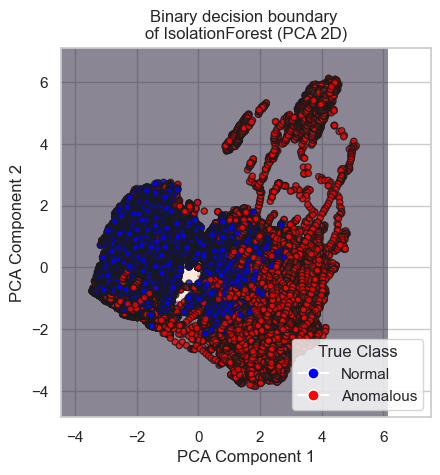

In [38]:
from sklearn.decomposition import PCA
from sklearn.inspection import DecisionBoundaryDisplay
import matplotlib.pyplot as plt
import numpy as np

# PCA 降维到 2D
pca = PCA(n_components=2)
X_2D = pca.fit_transform(X_scaled)

# 使用降维后的数据重新训练 IsolationForest
isolation_forest_2D = IsolationForest(
    n_estimators=100,             
    contamination="auto",           
    max_samples='auto',
    max_features=1,
    bootstrap=False,
    n_jobs=-1,
    random_state=222,
    verbose=1,
    warm_start=False
)

isolation_forest_2D.fit(X_2D)

# 决策边界显示
disp = DecisionBoundaryDisplay.from_estimator(
    isolation_forest_2D,
    X_2D,
    response_method="predict",
    alpha=0.5,
    grid_resolution=500  # 提高網格分辨率
)

disp.ax_.scatter(
    X_2D[:, 0],
    X_2D[:, 1],
    c=colors[labels],  # 按標籤選擇顏色
    s=20,
    edgecolor="k",
    alpha=0.8,  # 增加透明度
)

disp.ax_.set_title("Binary decision boundary \nof IsolationForest (PCA 2D)")
disp.ax_.set_xlabel("PCA Component 1")  # 添加 X 軸標籤
disp.ax_.set_ylabel("PCA Component 2")  # 添加 Y 軸標籤
plt.axis("square")
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker="o", color="w", label="Normal", markerfacecolor="blue", markersize=8),
        plt.Line2D([0], [0], marker="o", color="w", label="Anomalous", markerfacecolor="red", markersize=8),
    ],
    title="True Class",
    loc="lower right",  # 調整圖例位置
)
plt.show()

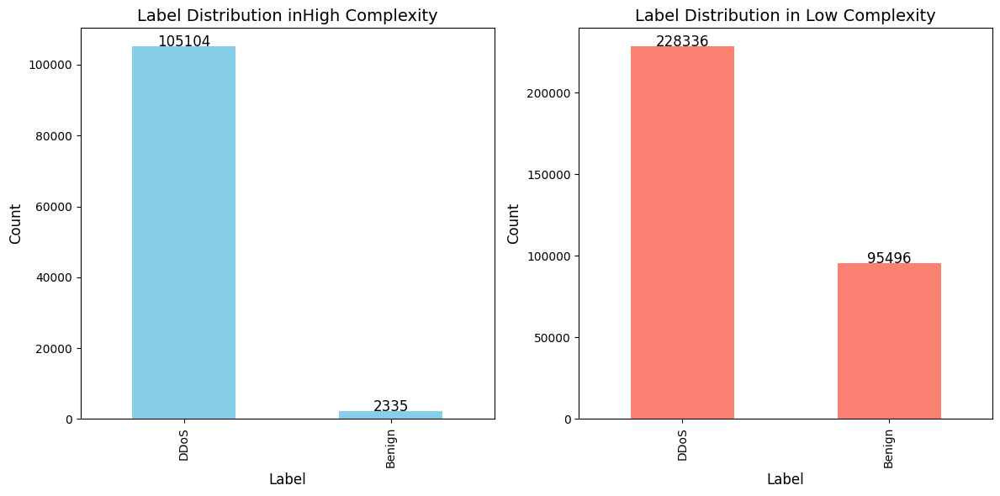


Normal Data Label Counts:
Label
DDoS      105104
Benign      2335
Name: count, dtype: int64

Anomalous Data Label Counts:
Label
DDoS      228336
Benign     95496
Name: count, dtype: int64


In [41]:
import matplotlib.pyplot as plt

# 假設你的資料已經在 df 中，並且已經有 'Anomaly Label' 這一列


# 過濾出 Normal 和 Anomalous 數據
Normal = data[data['Complexity_Label'] == 'High Complexity']
Anomalous = data[data['Complexity_Label'] == 'Low Complexity']

# 計算每個 Label 在各類別中的數量
normal_label_counts = Normal['Label'].value_counts()
anomalous_label_counts = Anomalous['Label'].value_counts()

# 設置圖形大小
plt.figure(figsize=(12, 6))

# 生成兩個條形圖
plt.subplot(1, 2, 1)
normal_label_counts.plot(kind='bar', color='skyblue')
plt.title("Label Distribution inHigh Complexity", fontsize=14)
plt.xlabel("Label", fontsize=12)
plt.ylabel("Count", fontsize=12)
for index, value in enumerate(normal_label_counts):
    plt.text(index, value + 0.2, str(value), ha='center', fontsize=12)

plt.subplot(1, 2, 2)
anomalous_label_counts.plot(kind='bar', color='salmon')
plt.title("Label Distribution in Low Complexity", fontsize=14)
plt.xlabel("Label", fontsize=12)
plt.ylabel("Count", fontsize=12)
for index, value in enumerate(anomalous_label_counts):
    plt.text(index, value + 0.2, str(value), ha='center', fontsize=12)

# 顯示圖形
plt.tight_layout()
plt.show()

# 顯示標籤數量
print("\nNormal Data Label Counts:")
print(normal_label_counts)
print("\nAnomalous Data Label Counts:")
print(anomalous_label_counts)

In [439]:
# Assuming df_original is already defined and contains the full dataset

# Copy the "Normal" and "Anomalous" data
Normal = df_original[df_original['Complexity_Label'] == 'High Complexity']
Anomalous = df_original[df_original['Complexity_Label'] == 'Low Complexity']

# Ensure the structure corresponds to df_original before dropping the column
df_normal = Normal[df_original.columns]  # Reorder to match df_original
df_anomalous = Anomalous[df_original.columns]  # Reorder to match df_original

# Drop the "Complexity_Label" column to keep the same structure as df_original
df_normal = df_normal.drop(columns=['Complexity_Label'], errors='ignore')
df_anomalous = df_anomalous.drop(columns=['Complexity_Label'], errors='ignore')

# Output the normal data to a Parquet file
df_normal.to_parquet('df_normal.parquet', index=False)

# Output the anomalous data to a Parquet file
df_anomalous.to_parquet('df_anomalous.parquet', index=False)

print("Files have been saved as Parquet.")

Files have been saved as Parquet.


In [24]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# 通道注意力模块 (Channel Attention)
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction_ratio=16):
        super(ChannelAttention, self).__init__()
        
        # 通道注意力计算部分
        self.avg_pool = nn.AdaptiveAvgPool2d(1)  # 使用平均池化得到全局信息
        self.max_pool = nn.AdaptiveMaxPool2d(1)  # 使用最大池化得到全局信息
        
        # 通过全连接层 (即 1x1 卷积) 计算每个通道的权重
        self.fc1 = nn.Conv2d(in_channels, in_channels // reduction_ratio, kernel_size=1, bias=False)  
        self.fc2 = nn.Conv2d(in_channels // reduction_ratio, in_channels, kernel_size=1, bias=False)
        
        # 使用 sigmoid 激活函数输出注意力权重
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(F.relu(self.fc1(self.avg_pool(x))))  # 平均池化后经过全连接
        max_out = self.fc2(F.relu(self.fc1(self.max_pool(x))))  # 最大池化后经过全连接
        out = avg_out + max_out  # 合并两个池化方式的输出
        return self.sigmoid(out)  # 返回通道注意力权重

# 空间注意力模块 (Spatial Attention)
class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        
        # 进行卷积操作来生成空间注意力图
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=(kernel_size-1)//2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # 对输入进行平均池化和最大池化，得到两个通道
        avg_out = torch.mean(x, dim=1, keepdim=True)  # 平均池化
        max_out, _ = torch.max(x, dim=1, keepdim=True)  # 最大池化
        x_cat = torch.cat([avg_out, max_out], dim=1)  # 将两种池化结果合并
        out = self.conv1(x_cat)  # 使用卷积生成空间注意力图
        return self.sigmoid(out)  # 返回空间注意力权重

# CBAM模块
class CBAM(nn.Module):
    def __init__(self, in_channels, reduction_ratio=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_attention = ChannelAttention(in_channels, reduction_ratio)
        self.spatial_attention = SpatialAttention(kernel_size)

    def forward(self, x):
        # 先进行通道注意力加权
        x = x * self.channel_attention(x)
        # 然后进行空间注意力加权
        x = x * self.spatial_attention(x)
        return x

# 示例 CNN 模型：简单的卷积神经网络，集成了 CBAM 模块
class SimpleCNNWithCBAM(nn.Module):
    def __init__(self):
        super(SimpleCNNWithCBAM, self).__init__()
        # 定义卷积层
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)  # 第一层卷积，输入3个通道，输出64个通道
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)  # 第二层卷积
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)  # 第三层卷积
        
        # 定义池化层
        self.pool = nn.MaxPool2d(2, 2)
        
        # CBAM模块
        self.cbam = CBAM(256)  # 将 CBAM 模块放在最后一层卷积后

        # 定义全连接层
        self.fc1 = nn.Linear(256 * 8 * 8, 1024)  # 假设输入图像大小为 64x64
        self.fc2 = nn.Linear(1024, 10)  # 假设输出为 10 类

    def forward(self, x):
        # 经过第一层卷积和池化
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        
        # 经过第二层卷积和池化
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        
        # 经过第三层卷积和池化
        x = F.relu(self.conv3(x))
        x = self.pool(x)
        
        # 加入 CBAM 模块进行注意力加权
        x = self.cbam(x)
        
        # 将特征图展平
        x = x.view(-1, 256 * 8 * 8)  # 展平特征图以输入全连接层
        
        # 经过全连接层
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        
        return x

# 示例：创建模型并打印结构
model = SimpleCNNWithCBAM()
print(model)

SimpleCNNWithCBAM(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (cbam): CBAM(
    (channel_attention): ChannelAttention(
      (avg_pool): AdaptiveAvgPool2d(output_size=1)
      (max_pool): AdaptiveMaxPool2d(output_size=1)
      (fc1): Conv2d(256, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (fc2): Conv2d(16, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (sigmoid): Sigmoid()
    )
    (spatial_attention): SpatialAttention(
      (conv1): Conv2d(2, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
      (sigmoid): Sigmoid()
    )
  )
  (fc1): Linear(in_features=16384, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=10, bias=True)
)
